## Pan-Tompkins Algorithm for Heart Rate detection from ECG-Signal
---

### Import Modules

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from data import data
import sys

fs = 125 # Sampling frequency

---

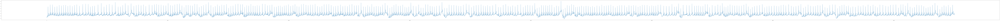

In [12]:
# plotting original signal
plt.figure(figsize=(400, 8))
plt.plot(data)

### Low Pass and High Pass Filters

These filters works good with 125Hz sampling rate if you are using other then 125 please calculate your own Cofficents and put them in below filters

Note: You can find the code for the calculation of Cofficents at "python/filter/ECGFilter.ipynb" 


In [2]:
#Function For High Pass Filter
hprevFilterd =  0.0
hprevUnFiltered =  0.0
hprevprevUnfiltered =  0.0
hprevprevFilterd =  0.0


def filterDataHighPass(val):
    global hprevFilterd, hprevUnFiltered, hprevprevUnfiltered, hprevprevFilterd
    ### Cofficents for different frequency
    # y = 0.9685226296016372*val + 1.936054188800943*hprevFilterd + -1.9370452592032743*hprevUnFiltered + -0.9380363296056057*hprevprevFilterd + 0.9685226296016372*hprevprevUnfiltered     #TODO 0.9
    # y = 0.9702445644512742*val + 1.9396035468939803*hprevFilterd + -1.9404891289025485*hprevUnFiltered + -0.941374710911116*hprevprevFilterd + 0.9702445644512744*hprevprevUnfiltered     #TODO 0.85
    # y = 0.9719696493475884*val + 1.9431534437454792*hprevFilterd + -1.9439392986951771*hprevUnFiltered + -0.9447251536448744*hprevprevFilterd + 0.9719696493475888*hprevprevUnfiltered    #TODO 0.80
    y = 0.9736978852077434*val + 1.9467038494842983*hprevFilterd + -1.9473957704154865*hprevUnFiltered + -0.9480876913466759*hprevprevFilterd + 0.9736978852077433*hprevprevUnfiltered      #TODO 0.75
    # y = 0.9754292728971999*val + 1.950254734016874*hprevFilterd + -1.9508585457943999*hprevUnFiltered + -0.951462357571926*hprevprevFilterd + 0.9754292728971999*hprevprevUnfiltered      #TODO 0.7
    # y = 0.9789015069644209*val + 1.9573578179706088*hprevFilterd + -1.9578030139288418*hprevUnFiltered + -0.9582482098870743*hprevprevFilterd + 0.9789015069644209*hprevprevUnfiltered    #TODO 0.6
    # y = 0.9823863574202832*val + 1.9644624503696302*hprevFilterd - 1.9647727148405665*hprevUnFiltered - 0.9650829793115031*hprevprevFilterd + 0.9823863574202832*hprevprevUnfiltered      #TODO 0.5
    hprevprevFilterd =  hprevFilterd
    hprevFilterd =  y
    hprevprevUnfiltered =  hprevUnFiltered
    hprevUnFiltered =  val
    return y

In [3]:
# Low Pass Filter Function with Coffecient Values
prevFilterd =  0.0
prevUnFiltered =  0.0
prevprevUnfiltered =  0.0
prevprevFilterd =  0.0
def filterData(val):
    global prevFilterd, prevUnFiltered, prevprevUnfiltered, prevprevFilterd
    y = 0.2564056711091054*val + 0.14992656822522105*prevFilterd + 0.5128113422182107*prevUnFiltered - 0.1755492526616423*prevprevFilterd +  0.2564056711091051*prevprevUnfiltered
    prevprevFilterd =  prevFilterd
    prevFilterd =  y
    prevprevUnfiltered =  prevUnFiltered
    prevUnFiltered =  val
    return y

---

### Apply High Pass and Low Pass Filters

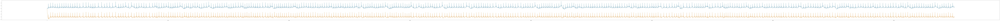

In [4]:
## Apply High pass and Plot Signal
finalSignal = np.zeros(len(data))
for i in range(0, len(data)):
    finalSignal[i] = filterDataHighPass(data[i])
    
plt.figure(figsize=(400, 8))
plt.plot(data)
plt.plot(finalSignal)

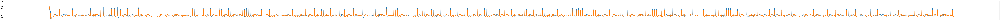

In [5]:
# Now Apply Low Pass Filter And Plot
lowPass = np.zeros(len(finalSignal));
for i in range(0, len(finalSignal)):
    lowPass[i] = filterData(finalSignal[i])

plt.figure(figsize=(200, 4))
plt.plot(finalSignal)
plt.plot(lowPass)

finalSignal = lowPass

---

### Pan-Tompkins Algorithm

In [6]:
class Pan_Tompkins_QRS():
  
  def band_pass_filter(self,signal):
    '''
    Band Pass Filter
    :param signal: input signal 
    :return: prcoessed signal

    Methodology/Explaination:
    Bandpass filter is used to attenuate the noise in the input signal.
    To acheive a passband of 5-15 Hz, the input signal is first passed 
    through a low pass filter having a cutoff frequency of 11 Hz and then
    through a high pass filter with a cutoff frequency of 5 Hz, thus
    achieving the required thresholds. 

    The low pass filter has the recursive equation:
      y(nT) = 2y(nT - T) - y(nT - 2T) + x(nT) - 2x(nT - 6T) + x(nT - 12T)

    The high pass filter has the recursive equation:
      y(nT) = 32x(nT - 16T) - y(nT - T) - x(nT) + x(nT - 32T)
    '''

    # Initialize result
    result = None

    # Create a copy of the input signal
    sig = signal.copy()
	
    # Apply the low pass filter using the equation given
    for index in range(len(signal)):
      sig[index] = signal[index]

      if (index >= 1):
        sig[index] += 2*sig[index-1]

      if (index >= 2):
        sig[index] -= sig[index-2]

      if (index >= 6):
        sig[index] -= 2*signal[index-6]

      if (index >= 12):
        sig[index] += signal[index-12] 
	
    # Copy the result of the low pass filter
    result = sig.copy()

    # Apply the high pass filter using the equation given
    for index in range(len(signal)):
      result[index] = -1*sig[index]

      if (index >= 1):
        result[index] -= result[index-1]

      if (index >= 16):
        result[index] += 32*sig[index-16]

      if (index >= 32):
        result[index] += sig[index-32]

    # Normalize the result from the high pass filter
    max_val = max(max(result),-min(result))
    result = result/max_val
 
    return result

  def derivative(self,signal):
    '''
    Derivative Filter 
    :param signal: input signal
    :return: prcoessed signal

    Methodology/Explaination:
    The derivative of the input signal is taken to obtain the
    information of the slope of the signal. Thus, the rate of change
    of input is obtain in this step of the algorithm.

    The derivative filter has the recursive equation:
      y(nT) = [-x(nT - 2T) - 2x(nT - T) + 2x(nT + T) + x(nT + 2T)]/(8T)
    '''

    # Initialize result
    result = signal.copy()

    # Apply the derivative filter using the equation given
    for index in range(len(signal)):
      result[index] = 0

      if (index >= 1):
        result[index] -= 2*signal[index-1]

      if (index >= 2):
        result[index] -= signal[index-2]

      if (index >= 2 and index <= len(signal)-2):
        result[index] += 2*signal[index+1]

      if (index >= 2 and index <= len(signal)-3):
        result[index] += signal[index+2]

      result[index] = (result[index]* fs)/8

    return result

  def squaring(self,signal):
    '''
    Squaring the Signal
    :param signal: input signal
    :return: prcoessed signal

    Methodology/Explaination:
    The squaring process is used to intensify the slope of the
    frequency response curve obtained in the derivative step. This
    step helps in restricting false positives which may be caused
    by T waves in the input signal.

    The squaring filter has the recursive equation:
      y(nT) = [x(nT)]^2
    '''

    # Initialize result
    result = signal.copy()

    # Apply the squaring using the equation given
    for index in range(len(signal)):
      result[index] = signal[index]**2

    return result    

  def moving_window_integration(self,signal):
    '''
    Moving Window Integrator
    :param signal: input signal
    :return: prcoessed signal

    Methodology/Explaination:
    The moving window integration process is done to obtain
    information about both the slope and width of the QRS complex.
    A window size of 0.15*(sample frequency) is used for more
    accurate results.

    The moving window integration has the recursive equation:
      y(nT) = [y(nT - (N-1)T) + x(nT - (N-2)T) + ... + x(nT)]/N

      where N is the number of samples in the width of integration
      window.
    '''

    # Initialize result and window size for integration
    result = signal.copy()
    win_size = round(0.150 * fs)
    sum = 0

    # Calculate the sum for the first N terms
    for j in range(win_size):
      sum += signal[j]/win_size
      result[j] = sum
    
    # Apply the moving window integration using the equation given
    for index in range(win_size,len(signal)):  
      sum += signal[index]/win_size
      sum -= signal[index-win_size]/win_size
      result[index] = sum

    return result

  def solve(self,signal):
    '''
    Solver, Combines all the above functions
    :param signal: input signal
    :return: prcoessed signal

    Methodology/Explaination:
    The peak detection algorithm works on the moving window and bandpass
    filtered signal. So the input signal is first bandpassed, then the
    output of the bandpass filter is given to the derivative function and
    the result is squared. Finally the output of the squaring function
    is given to the moving window integration function and returned. 
    '''

    # Convert the input signal into numpy array
    input_signal = signal

    # Bandpass Filter
    global bpass
    bpass = self.band_pass_filter(input_signal.copy())

    # Derivative Function
    global der
    der = self.derivative(bpass.copy())

    # Squaring Function
    global sqr
    sqr = self.squaring(der.copy())

    # Moving Window Integration Function
    global mwin
    mwin = self.moving_window_integration(sqr.copy())

    return mwin

In [7]:
def detect_peaks(ecg_signal, fs, integration_signal, band_pass_signal): 
    possible_peaks = []
    signal_peaks = []
    r_peaks = []
    
    SPKI = 0
    
    SPKF = 0
    
    NPKI = 0
    
    NPKF = 0
    rr_avg_one = []
    
    THRESHOLDI1 = 0
    
    THRESHOLDF1 = 0
    rr_avg_two = []
    
    THRESHOLDI2 = 0
    
    THRESHOLDF2 = 0
    
    is_T_found = 0
    
    window = round(0.15 * fs)            

    
    FM_peaks = []
    
    integration_signal_smooth = np.convolve(integration_signal, np.ones((20,)) / 20, mode = 'same')    
    localDiff = np.diff(integration_signal_smooth)
    
    

    for i in range(1,len(localDiff)):
        if i-1 > 2*fs and localDiff[i-1] > 0 and localDiff[i] < 0 :
            FM_peaks.append(i-1)           

    
    for index in range(len(FM_peaks)):

        
        current_peak = FM_peaks[index]
        left_limit = max(current_peak-window, 0) 
        right_limit = min(current_peak+window+1, len(band_pass_signal))
        max_index = -1
        max_value = -sys.maxsize
        for i in range(left_limit, right_limit):
            if(band_pass_signal[i] > max_value):
                max_value = band_pass_signal[i]
                max_index = i
        if (max_index != -1):
            possible_peaks.append(max_index)

        if (index == 0 or index > len(possible_peaks)):
          
          if (integration_signal[current_peak] >= THRESHOLDI1): 
              SPKI = 0.125 * integration_signal[current_peak]  + 0.875 * SPKI
              if possible_peaks[index] > THRESHOLDF1:                                            
                  SPKF = 0.125 * band_pass_signal[index] + 0.875 * SPKF 
                  signal_peaks.append(possible_peaks[index])                             
              else:
                  NPKF = 0.125 * band_pass_signal[index] + 0.875 * NPKF                                    
              
          elif ( (integration_signal[current_peak] > THRESHOLDI2 and integration_signal[current_peak] < THRESHOLDI1) or (integration_signal[current_peak] < THRESHOLDI2)):
              NPKI = 0.125 * integration_signal[current_peak]  + 0.875 * NPKI  
              NPKF = 0.125 * band_pass_signal[index] + 0.875 * NPKF

        else:
            RRAVERAGE1 = np.diff(FM_peaks[max(0,index-8):index + 1]) / fs
            rr_one_mean = np.mean(RRAVERAGE1)
            rr_avg_one.append(rr_one_mean) 
            limit_factor = rr_one_mean
              
            if (index >= 8):
                
                for RR in RRAVERAGE1:
                    if RR > RR_LOW_LIMIT and RR < RR_HIGH_LIMIT:                              
                        rr_avg_two.append(RR)
                        if (len(rr_avg_two) == 9):
                          rr_avg_two.pop(0)     
                          limit_factor = np.mean(rr_avg_two)
            
            if (len(rr_avg_two) == 8 or index < 8):
                RR_LOW_LIMIT = 0.92 * limit_factor        
                RR_HIGH_LIMIT = 1.16 * limit_factor
                RR_MISSED_LIMIT = 1.66 * limit_factor

            
            if rr_avg_one[-1] < RR_LOW_LIMIT or rr_avg_one[-1] > RR_MISSED_LIMIT: 
                THRESHOLDI1 = THRESHOLDI1/2
                THRESHOLDF1 = THRESHOLDF1/2
               
            
            curr_rr_interval = RRAVERAGE1[-1]
            search_back_window = round(curr_rr_interval * fs)
            if curr_rr_interval > RR_MISSED_LIMIT:
                left_limit = current_peak - search_back_window +1
                right_limit = current_peak + 1
                search_back_max_index = -1 
                max_value =  -sys.maxsize
                
                for i in range(left_limit, right_limit):
                  if (integration_signal[i] > THRESHOLDI1 and integration_signal[i] > max_value ):
                    max_value = integration_signal[i]
                    search_back_max_index = i
              
                if (search_back_max_index != -1):   
                    SPKI = 0.25 * integration_signal[search_back_max_index] + 0.75 * SPKI                         
                    THRESHOLDI1 = NPKI + 0.25 * (SPKI - NPKI)
                    THRESHOLDI2 = 0.5 * THRESHOLDI1               
                    
                    left_limit = search_back_max_index - round(0.15 * fs)
                    right_limit = min(len(band_pass_signal), search_back_max_index)

                    search_back_max_index2 = -1 
                    max_value =  -sys.maxsize
                    
                    for i in range(left_limit, right_limit):
                      if (band_pass_signal[i] > THRESHOLDF1 and band_pass_signal[i] > max_value ):
                        max_value = band_pass_signal[i]
                        search_back_max_index2 = i

                    
                    if band_pass_signal[search_back_max_index2] > THRESHOLDF2: 
                        SPKF = 0.25 * band_pass_signal[search_back_max_index2] + 0.75 * SPKF                            
                        THRESHOLDF1 = NPKF + 0.25 * (SPKF - NPKF)
                        THRESHOLDF2 = 0.5 * THRESHOLDF1                            
                        signal_peaks.append(search_back_max_index2)                                                 
    
            
            if (integration_signal[current_peak] >= THRESHOLDI1): 
                if (curr_rr_interval > 0.20 and curr_rr_interval < 0.36 and index > 0): 
                    
                    current_slope = max(np.diff(integration_signal[current_peak - round(fs * 0.075):current_peak + 1]))
                    
                    previous_slope = max(np.diff(integration_signal[FM_peaks[index - 1] - round(fs * 0.075): FM_peaks[index - 1] + 1]))
                    if (current_slope < 0.5 * previous_slope): 
                        NPKI = 0.125 * integration_signal[current_peak] + 0.875 * NPKI                                            
                        is_T_found = 1                              
                
                if (not is_T_found):
                    SPKI = 0.125 * integration_signal[current_peak]  + 0.875 * SPKI
                    
                    if possible_peaks[index] > THRESHOLDF1:                                            
                        SPKF = 0.125 * band_pass_signal[index] + 0.875 * SPKF 
                        signal_peaks.append(possible_peaks[index])                             
                    else:
                        NPKF = 0.125 * band_pass_signal[index] + 0.875 * NPKF                   
                                        
            elif ((integration_signal[current_peak] > THRESHOLDI1 and integration_signal[current_peak] < THRESHOLDI2) or (integration_signal[current_peak] < THRESHOLDI1)):
                NPKI = 0.125 * integration_signal[current_peak]  + 0.875 * NPKI  
                NPKF = 0.125 * band_pass_signal[index] + 0.875 * NPKF
       
        THRESHOLDI1 = NPKI + 0.25 * (SPKI - NPKI)
        THRESHOLDF1 = NPKF + 0.25 * (SPKF - NPKF)
        THRESHOLDI2 = 0.5 * THRESHOLDI1 
        THRESHOLDF2 = 0.5 * THRESHOLDF1
        is_T_found = 0  

    
    for i in np.unique(signal_peaks):
        i = int(i)
        window = round(0.2 * fs)
        left_limit = i-window
        right_limit = min(i+window+1, len(ecg_signal))
        max_value = -sys.maxsize
        max_index = -1
        for i in range(left_limit, right_limit):
            if (ecg_signal[i] > max_value):
                max_value = ecg_signal[i]
                max_index = i

        r_peaks.append(max_index)
        
    return r_peaks

---

### Get Result

In [8]:
QRS_detector = Pan_Tompkins_QRS()
output_singal = QRS_detector.solve(np.array(finalSignal))
peaks = detect_peaks(finalSignal.copy() , fs, mwin, bpass)
# Clip the x locations less than 0 (Learning Phase)
peaks = np.array(peaks)
peaks = peaks[peaks > 0]
signal = np.array(finalSignal.copy())

# Calculate the heart rate
heartRate = (60*fs)/np.average(np.diff(peaks[1:]))
print("Heart Rate",heartRate, "BPM")

Heart Rate 78.44300078173437 BPM


---

### visualize data

Text(0.5, 1.0, 'R Peak Locations')

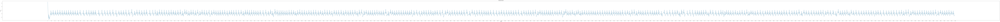

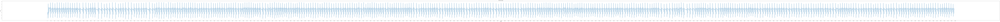

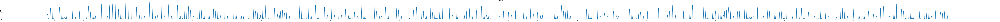

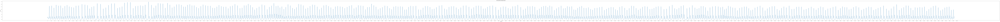

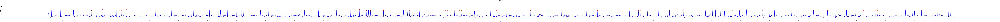

In [9]:
# Plotting bandpassed signal
plt.figure(figsize = (400,8), dpi = 100)
plt.xticks(np.arange(0, len(bpass)+1, 150))
plt.plot(bpass[32:len(bpass)-2])
plt.xlabel('Samples')
plt.ylabel('MLIImV')
plt.title("Bandpassed Signal")

# Plotting derived signal
plt.figure(figsize = (400,8), dpi = 100)
plt.xticks(np.arange(0, len(der)+1, 150))
plt.plot(der[32:len(der)-2])
plt.xlabel('Samples')
plt.ylabel('MLIImV')
plt.title("Derivative Signal")

# Plotting squared signal
plt.figure(figsize = (400,8), dpi = 100)
plt.xticks(np.arange(0, len(sqr)+1, 150))
plt.plot(sqr[32:len(sqr)-2])
plt.xlabel('Samples')
plt.ylabel('MLIImV')
plt.title("Squared Signal")

# Plotting moving window integrated signal
plt.figure(figsize = (400,8), dpi = 100)
plt.xticks(np.arange(0, len(mwin)+1, 150))
plt.plot(mwin[100:len(mwin)-2])
plt.xlabel('Samples')
plt.ylabel('MLIImV')
plt.title("Moving Window Integrated Signal")

# Plotting the R peak locations in ECG signal
plt.figure(figsize = (400,8) , dpi = 100)
plt.xticks(np.arange(0, len(signal)+1, 150))
plt.plot(signal, color = 'blue')        
plt.scatter(peaks, signal[peaks], color = 'red', s = 50, marker= '*')
plt.xlabel('Samples')
plt.ylabel('MLIImV')
plt.title("R Peak Locations")

---